In [3]:
"""IMPORT BIBLIOTEK"""
import mne 
import matplotlib.pyplot as plt
import numpy as np 
from mne.preprocessing import ICA, create_eog_epochs, create_ecg_epochs #funkcje ica
from mne_icalabel import label_components #ica-label algorytm
import onnxruntime #biblioteka do obsługi ica-label
#backend matplotliba 
%matplotlib qt 

In [4]:
"""WSTĘPNE USTAWIENIA PRZED WCZYTANIEM SYGNAŁU"""
d_path = "eeg_files/20241017_kp.bdf" #ścieżka do pliku
ch_eog = ["EXG1","EXG2"] #zdefiniowanie dedykowanych kanałów EOG
ch_ecg = ["EXG3","EXG4"] #zdefiniowanie dedykowanych kanałów ECG
ch_exclude = [f"EXG{i}" for i in range(5,9)] #wykluczenie kanałów niewykorzystanych w badaniu

In [5]:
"""ZAŁADOWANIE SYGNAŁU I USTAWIENIE UKŁADU ELEKTROD"""
raw_original = mne.io.read_raw_bdf(
    d_path, preload = True, eog = ch_eog, misc = ch_ecg, exclude = ch_exclude 
)
raw_original.set_montage("biosemi64") #ustawienie montazu biosemi


Extracting EDF parameters from /Users/szymbierz/Desktop/wszystko/notebooks/statystyka/inne/eeg/eeg_files/20241017_kp.bdf...
BDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2928639  =      0.000 ...  1430.000 secs...


<RawEDF | 20241017_kp.bdf, 69 x 2928640 (1430.0 s), ~1.51 GiB, data loaded>

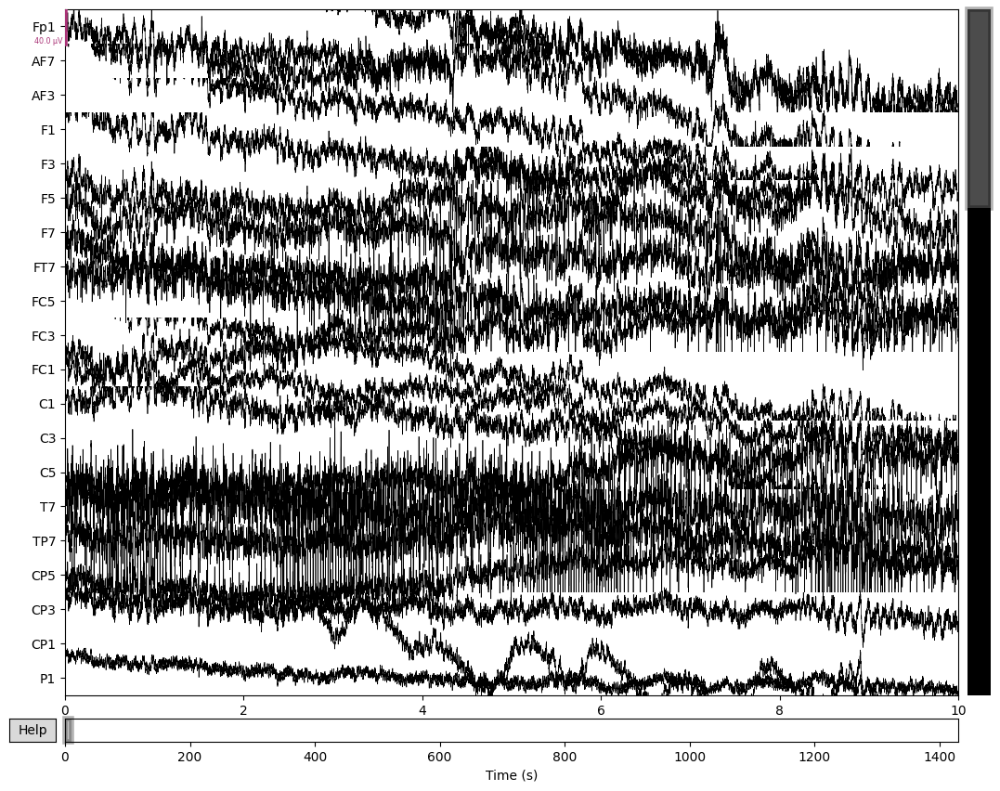

Channels marked as bad:
none


In [19]:
raw_original.plot()

OCENA ZŁYCH KANAŁÓW

Effective window size : 1.000 (s)
Plotting power spectral density (dB=True).


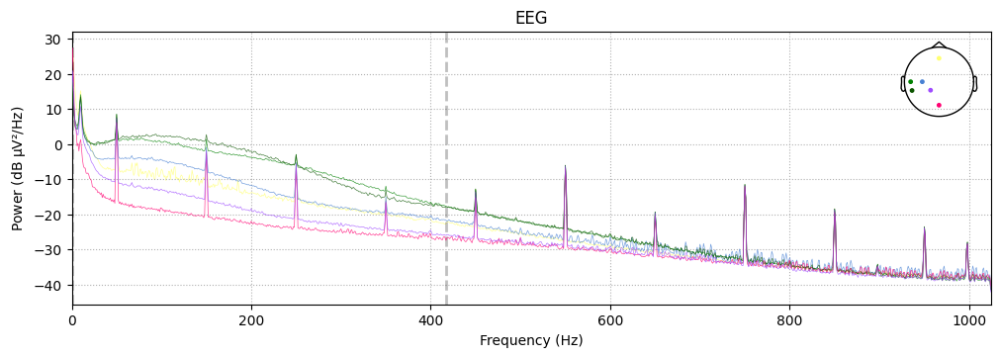

Channels marked as bad:
none


In [6]:
"""PSD POTENCJALNIE ZŁYCH KANAŁÓW"""
raw_original.compute_psd(picks=["T7","TP7","POz","CP1","AFz","C3"]).plot()

In [11]:
"""OBLCZENIE MACIERZY KORELACJI"""
channels_to_check = ["T7","TP7","POz","CP1","AFz","C3"]
data = raw_original.copy().pick_channels(channels_to_check).get_data()
corr = np.corrcoef(data)


In [26]:
"""HEATMAPA"""
plt.figure(figsize=(8, 6))
plt.imshow(corr, vmin=-1, vmax=1, cmap='RdBu_r', interpolation='nearest')
plt.colorbar(label='Pearson r')
plt.xticks(np.arange(len(channels_to_check)), channels_to_check, rotation=90)
plt.yticks(np.arange(len(channels_to_check)), channels_to_check)
plt.title("Macierz korelacji surowego sygnału EEG")
plt.tight_layout()
plt.show()


In [29]:
"""ŚREDNIA KORELACJA"""
mean_corr = corr.mean(axis=1)
sorted_idx = np.argsort(mean_corr)
print("Kanały o najniższej średniej korelacji:")
for idx in sorted_idx:
    print(f"{channels_to_check[idx]}: mean r = {mean_corr[idx]:.2f}")

Kanały o najniższej średniej korelacji:
POz: mean r = -0.01
AFz: mean r = 0.16
TP7: mean r = 0.52
CP1: mean r = 0.53
T7: mean r = 0.53
C3: mean r = 0.57


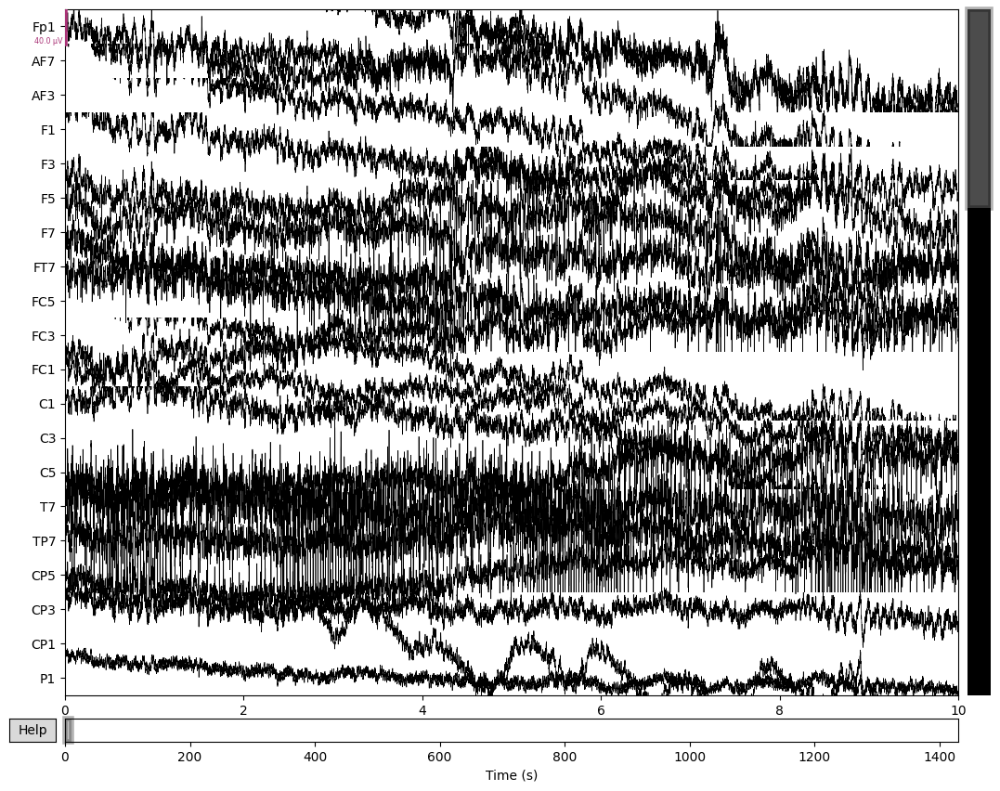

Channels marked as bad:
none


In [30]:
raw_original.plot()

Effective window size : 1.000 (s)
Plotting power spectral density (dB=True).


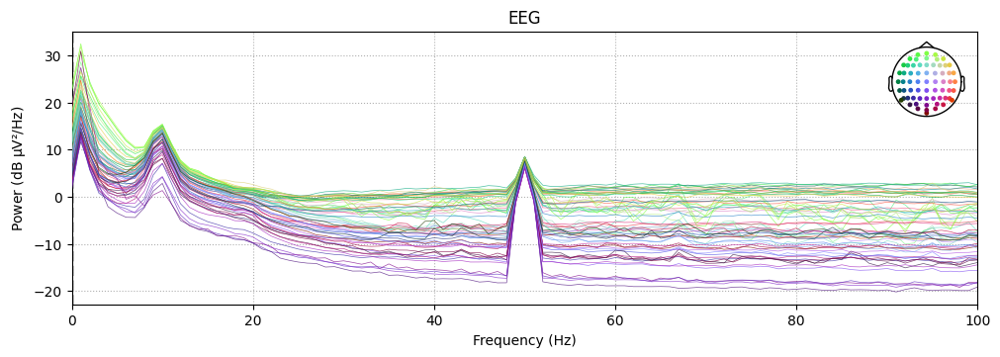

In [34]:
"""PSD WSZYSTKICH KANAŁÓW"""
raw_original.compute_psd(picks="eeg",fmax=100).plot()

In [40]:
"""OBLCZENIE MACIERZY KORELACJI WSZYSTKICH KANAŁÓW"""
all_channels = raw_original.ch_names
data_2 = raw_original.copy().pick(all_channels).get_data()
corr_2 = np.corrcoef(data_2)


In [51]:
"""HEATMAPA KORELACJI WSZYSTKICH KANAŁÓW"""

plt.figure(figsize=(10, 10))
plt.imshow(corr_2, cmap='RdBu_r', interpolation='nearest')
plt.colorbar(label='Pearson r')
plt.xticks(np.arange(len(all_channels)), all_channels, rotation=90)
plt.yticks(np.arange(len(all_channels)), all_channels)
plt.tight_layout()


In [48]:
"""ŚREDNIA KORELACJA WSZYSTKICH KANAŁÓW"""
mean_corr_2 = corr_2.mean(axis=1)
sorted_idx_2 = np.argsort(mean_corr_2)
for idx in sorted_idx_2:
    print(f"{all_channels[idx]}: mean r = {mean_corr_2[idx]:.2f}")

C4: mean r = -0.67
CPz: mean r = -0.56
CP4: mean r = -0.45
CP2: mean r = -0.40
Oz: mean r = -0.35
POz: mean r = -0.32
EXG2: mean r = -0.31
AFz: mean r = -0.11
Status: mean r = 0.05
EXG4: mean r = 0.36
EXG3: mean r = 0.37
Pz: mean r = 0.43
P2: mean r = 0.55
Fp2: mean r = 0.56
Fpz: mean r = 0.60
Fp1: mean r = 0.63
FC6: mean r = 0.67
Cz: mean r = 0.68
PO3: mean r = 0.69
AF8: mean r = 0.69
FCz: mean r = 0.69
CP6: mean r = 0.69
PO4: mean r = 0.70
C2: mean r = 0.70
C5: mean r = 0.71
AF3: mean r = 0.71
P4: mean r = 0.72
FT8: mean r = 0.72
CP5: mean r = 0.72
F1: mean r = 0.72
P9: mean r = 0.72
O2: mean r = 0.72
CP1: mean r = 0.72
F8: mean r = 0.72
AF4: mean r = 0.72
FC1: mean r = 0.73
F4: mean r = 0.73
Iz: mean r = 0.73
F6: mean r = 0.73
Fz: mean r = 0.73
P10: mean r = 0.73
F3: mean r = 0.73
F2: mean r = 0.73
FC5: mean r = 0.73
P5: mean r = 0.73
F5: mean r = 0.73
P3: mean r = 0.73
C1: mean r = 0.73
EXG1: mean r = 0.73
FT7: mean r = 0.73
T7: mean r = 0.73
FC4: mean r = 0.73
FC2: mean r = 0.74
T

Effective window size : 1.000 (s)
Plotting power spectral density (dB=True).


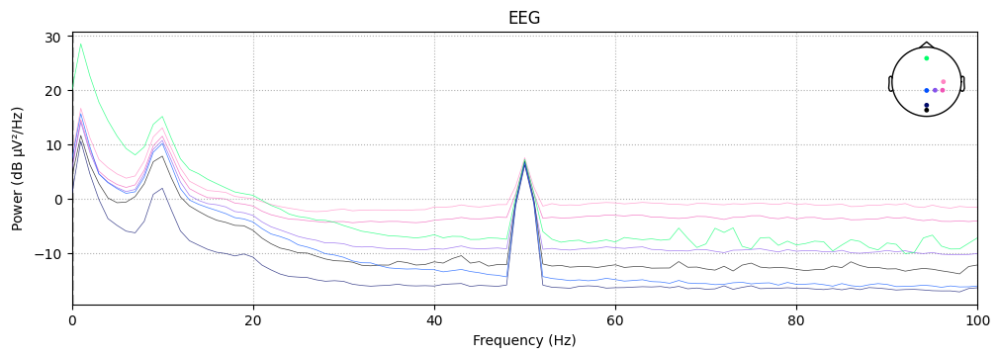

2025-05-13 11:20:01.598 Python[12093:12661671] _TIPropertyValueIsValid called with 16 on nil context!
2025-05-13 11:20:01.598 Python[12093:12661671] imkxpc_getApplicationProperty:reply: called with incorrect property value 16, bailing.
2025-05-13 11:20:01.598 Python[12093:12661671] Text input context does not respond to _valueForTIProperty:
2025-05-13 11:20:05.883 Python[12093:12661671] _TIPropertyValueIsValid called with 16 on nil context!
2025-05-13 11:20:05.883 Python[12093:12661671] imkxpc_getApplicationProperty:reply: called with incorrect property value 16, bailing.
2025-05-13 11:20:05.883 Python[12093:12661671] Text input context does not respond to _valueForTIProperty:


In [63]:
"""PSD POTENCJALNIE ZŁYCH KANAŁÓW Z KORELACJI"""
potentially_bad = ["Oz","POz","CPz","C4","CP4","CP2","AFz"]
raw_original.compute_psd(picks=potentially_bad,fmax=100).plot()

In [64]:
"""INTERPOLACAJA ZŁYCH KANAŁÓW"""
raw_original.info["bads"] = potentially_bad
raw_original.interpolate_bads(reset_bads=True)

Setting channel interpolation method to {'eeg': 'spline'}.
Interpolating bad channels.
    Automatic origin fit: head of radius 95.0 mm
Computing interpolation matrix from 57 sensor positions
Interpolating 7 sensors


<RawEDF | 20241017_kp.bdf, 69 x 2928640 (1430.0 s), ~1.51 GiB, data loaded>

In [67]:
"""KORELACJA PO INTERPOLACJI"""
all_channels_2 = raw_original.ch_names
data_3 = raw_original.copy().pick(all_channels_2).get_data()
corr_3 = np.corrcoef(data_3)

In [68]:
"""HEATMAPA KORELACJI WSZYSTKICH KANAŁÓW PO INTERPOLACJI"""
plt.figure(figsize=(10, 10))
plt.imshow(corr_3, cmap='RdBu_r', interpolation='nearest')
plt.colorbar(label='Pearson r')
plt.xticks(np.arange(len(all_channels_2)), all_channels_2, rotation=90)
plt.yticks(np.arange(len(all_channels_2)), all_channels_2)
plt.tight_layout()


2025-05-13 11:20:55.770 Python[12093:12661671] _TIPropertyValueIsValid called with 16 on nil context!
2025-05-13 11:20:55.770 Python[12093:12661671] imkxpc_getApplicationProperty:reply: called with incorrect property value 16, bailing.
2025-05-13 11:20:55.770 Python[12093:12661671] Text input context does not respond to _valueForTIProperty:
2025-05-13 11:21:05.100 Python[12093:12661671] _TIPropertyValueIsValid called with 16 on nil context!
2025-05-13 11:21:05.100 Python[12093:12661671] imkxpc_getApplicationProperty:reply: called with incorrect property value 16, bailing.
2025-05-13 11:21:05.100 Python[12093:12661671] Text input context does not respond to _valueForTIProperty:


In [6]:
"""USTAWIENIE ŚREDNIEJ REFERENCJI I FILTRA NOTCH"""
notch_freq = 50
raw = raw_original.copy()
raw.notch_filter(notch_freq)
raw.set_eeg_reference('average')

Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 13517 samples (6.600 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.6s


EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


<RawEDF | 20241017_kp.bdf, 69 x 2928640 (1430.0 s), ~1.51 GiB, data loaded>

In [70]:
"""STWORZENIE KOPI DO ADNOTACJI"""
raw_for_annotation = raw.copy()


In [71]:
"""FILTRACJA"""
raw_for_annotation.filter(l_freq=1.0,h_freq=40)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 6759 samples (3.300 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.7s


<RawEDF | 20241017_kp.bdf, 69 x 2928640 (1430.0 s), ~1.51 GiB, data loaded>

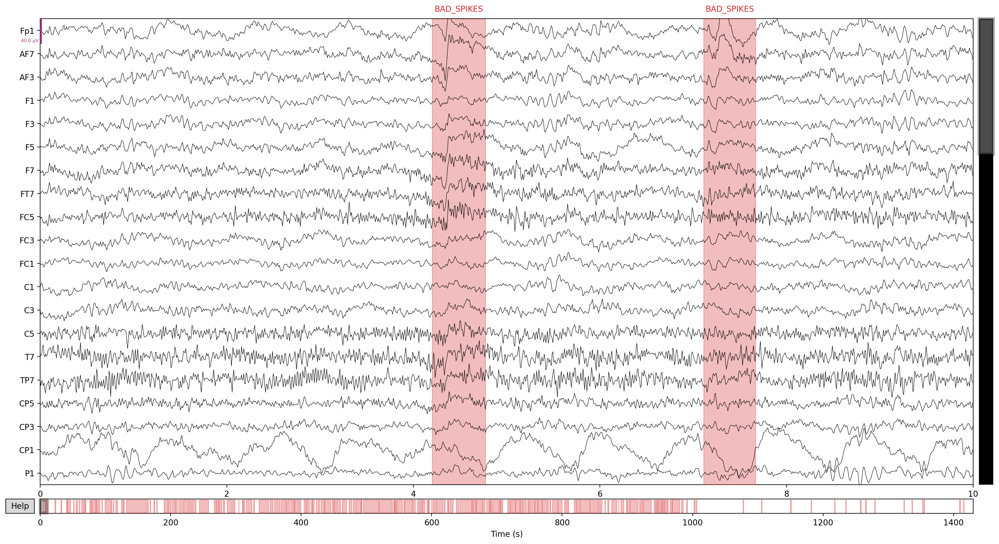

2025-05-13 11:57:28.444 Python[12093:12661671] _TIPropertyValueIsValid called with 16 on nil context!
2025-05-13 11:57:28.444 Python[12093:12661671] imkxpc_getApplicationProperty:reply: called with incorrect property value 16, bailing.
2025-05-13 11:57:28.444 Python[12093:12661671] Text input context does not respond to _valueForTIProperty:


Channels marked as bad:
none


2025-05-13 11:58:08.330 Python[12093:12661671] _TIPropertyValueIsValid called with 16 on nil context!
2025-05-13 11:58:08.330 Python[12093:12661671] imkxpc_getApplicationProperty:reply: called with incorrect property value 16, bailing.
2025-05-13 11:58:08.330 Python[12093:12661671] Text input context does not respond to _valueForTIProperty:


In [73]:
"""USTAWIANIE ADNOTACJI ZŁYCH SEGMENTÓW"""
raw_for_annotation.plot()

In [74]:
print(raw_for_annotation.annotations)

<Annotations | 193 segments: BAD_SPIKES (193)>


In [75]:
"""UTWORZENIE KOPI DO ICA"""
raw_for_ica_fitting = raw.copy() 
"""USTAWIENIE ADNOTACJI DLA RAW DO ICA"""
raw_for_ica_fitting.set_annotations(raw_for_annotation.annotations) 
"""USTAWIENIE FILTRACJI DLA ZGODNEJ Z ICA-Label"""
raw_for_ica_fitting.filter(l_freq=1.0,h_freq=100) 

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 1e+02 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 100.00 Hz
- Upper transition bandwidth: 25.00 Hz (-6 dB cutoff frequency: 112.50 Hz)
- Filter length: 6759 samples (3.300 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.7s


<RawEDF | 20241017_kp.bdf, 69 x 2928640 (1430.0 s), ~1.51 GiB, data loaded>

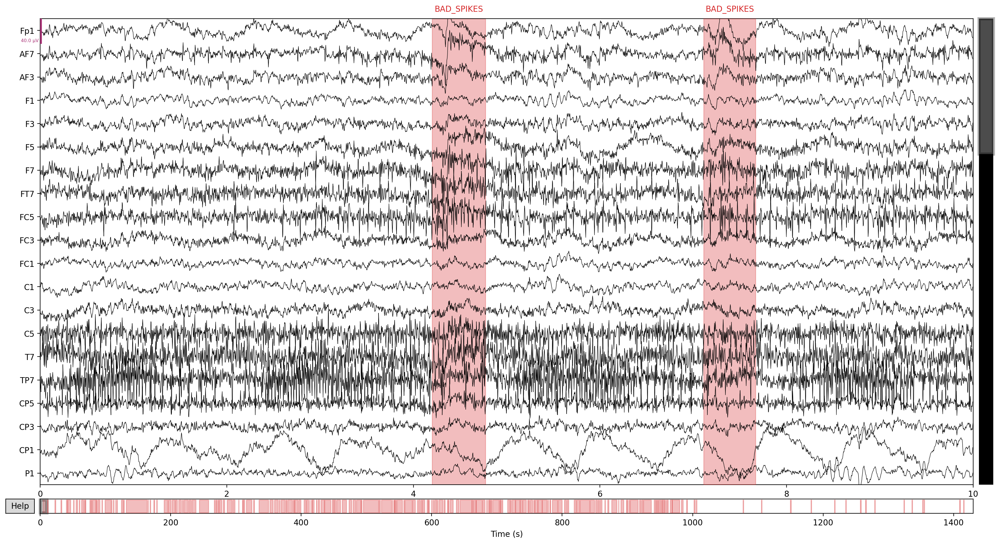

2025-05-13 11:59:40.103 Python[12093:12661671] _TIPropertyValueIsValid called with 16 on nil context!
2025-05-13 11:59:40.103 Python[12093:12661671] imkxpc_getApplicationProperty:reply: called with incorrect property value 16, bailing.
2025-05-13 11:59:40.103 Python[12093:12661671] Text input context does not respond to _valueForTIProperty:


Channels marked as bad:
none


2025-05-13 12:02:15.680 Python[12093:12661671] _TIPropertyValueIsValid called with 16 on nil context!
2025-05-13 12:02:15.680 Python[12093:12661671] imkxpc_getApplicationProperty:reply: called with incorrect property value 16, bailing.
2025-05-13 12:02:15.680 Python[12093:12661671] Text input context does not respond to _valueForTIProperty:


In [76]:
raw_for_ica_fitting.plot()

In [77]:
"""ZAINICJOWANIE ALGORYTMU ICA"""
ica = ICA(
    max_iter="auto",  #automatyczna liczba iteracji
    method="infomax",  #wymog ica-label
    random_state=97, #ziarno
    fit_params=dict(extended=True), #wymog ica-label
)
ica.fit(raw_for_ica_fitting,reject_by_annotation=True)  
ica.save("big_bads-ica.fif",overwrite=True,verbose=None)

Fitting ICA to data using 64 channels (please be patient, this may take a while)
Omitting 1317870 of 2928640 (45.00%) samples, retaining 1610770 (55.00%) samples.
Selecting by non-zero PCA components: 56 components
Computing Extended Infomax ICA
Fitting ICA took 196.3s.
Writing ICA solution to /Users/szymbierz/Desktop/wszystko/notebooks/statystyka/inne/eeg/big_bads-ica.fif...


Method,infomax
Fit parameters,extended=Truemax_iter=500
Fit,500 iterations on raw data (1610770 samples)
ICA components,56
Available PCA components,64
Channel types,eeg
ICA components marked for exclusion,—


In [78]:
#ica.plot_components()

[<MNEFigure size 1950x1934 with 20 Axes>,
 <MNEFigure size 1950x1934 with 20 Axes>,
 <MNEFigure size 1950x1934 with 16 Axes>]

2025-05-13 12:11:26.056 Python[12093:12661671] _TIPropertyValueIsValid called with 16 on nil context!
2025-05-13 12:11:26.056 Python[12093:12661671] imkxpc_getApplicationProperty:reply: called with incorrect property value 16, bailing.
2025-05-13 12:11:26.056 Python[12093:12661671] Text input context does not respond to _valueForTIProperty:
2025-05-13 12:11:49.939 Python[12093:12661671] _TIPropertyValueIsValid called with 16 on nil context!
2025-05-13 12:11:49.939 Python[12093:12661671] imkxpc_getApplicationProperty:reply: called with incorrect property value 16, bailing.
2025-05-13 12:11:49.939 Python[12093:12661671] Text input context does not respond to _valueForTIProperty:


In [79]:
"""SPRAWDZENIE OZNACZENIA ICALABEL"""
ic_labels_1 = label_components(raw_for_ica_fitting, ica, method='iclabel')
labels_1 = ic_labels_1["labels"]


In [81]:
"""SPRAWDZENIE ZAKLASYFIKOWANIA KOMPONENTÓW JAKO OTHER"""
EOG_LABEL
for idx,label in enumerate(labels_1):
    if label == "other":
        print(f"{idx} : {label}")
    

9 : other
14 : other
44 : other
50 : other
52 : other
54 : other
55 : other


In [87]:
"""SPRAWDZENIE ARTEFAKTOW EOG, ECG EMG ZA POMOCĄ FUNKCJI FIND_BADS_ NA EPOKACH)"""
eog_epochs = mne.preprocessing.create_eog_epochs(raw_for_ica_fitting,ch_name=ch_eog)
ecg_epochs = mne.preprocessing.create_ecg_epochs(raw_for_ica_fitting, ch_name = "EXG3", tmin=-0.5, tmax=0.5)
eog_indices, eog_scores = ica.find_bads_eog(eog_epochs, ch_name=ch_eog)
ecg_indices, ecg_scores = ica.find_bads_ecg(ecg_epochs, ch_name='EXG3', method='correlation')
emg_indices, emg_scores = ica.find_bads_muscle(raw_for_ica_fitting)
eog_incices_2, eog_scores_2 = ica.find_bads_eog(raw_for_ica_fitting,ch_name=ch_eog)
ecg_indices_2, ecg_scores_2 = ica.find_bads_ecg(raw_for_ica_fitting, ch_name='EXG3', method='correlation')



Using EOG channels: EXG1, EXG2
EOG channel index for this subject is: [64 65]
Omitting 1317870 of 2928640 (45.00%) samples, retaining 1610770 (55.00%) samples.
Filtering the data to remove DC offset to help distinguish blinks from saccades
Selecting channel EXG1 for blink detection
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 20480 samples (10.000 s)

Now detecting blinks and generating corresponding events
Found 50 significant peaks
Number of EOG events detected: 50
Not setting metadata
50 matching events found
No baseline correction applied
Using data from preloaded Raw for 50

/opt/homebrew/Cellar/jupyterlab/4.4.1_1/libexec/lib/python3.13/site-packages/mne/time_frequency/psd.py:257: UserWarning: nperseg = 2048 is greater than input length  = 1813, using nperseg = 1813
  return _func(*args, **kwargs)
/opt/homebrew/Cellar/jupyterlab/4.4.1_1/libexec/lib/python3.13/site-packages/mne/time_frequency/psd.py:257: UserWarning: nperseg = 2048 is greater than input length  = 914, using nperseg = 914
  return _func(*args, **kwargs)
/opt/homebrew/Cellar/jupyterlab/4.4.1_1/libexec/lib/python3.13/site-packages/mne/time_frequency/psd.py:257: UserWarning: nperseg = 2048 is greater than input length  = 1229, using nperseg = 1229
  return _func(*args, **kwargs)
/opt/homebrew/Cellar/jupyterlab/4.4.1_1/libexec/lib/python3.13/site-packages/mne/time_frequency/psd.py:257: UserWarning: nperseg = 2048 is greater than input length  = 1628, using nperseg = 1628
  return _func(*args, **kwargs)
/opt/homebrew/Cellar/jupyterlab/4.4.1_1/libexec/lib/python3.13/site-packages/mne/time_frequenc

Using EOG channels: EXG1, EXG2
Omitting 1317870 of 2928640 (45.00%) samples, retaining 1610770 (55.00%) samples.
Omitting 1317870 of 2928640 (45.00%) samples, retaining 1610770 (55.00%) samples.
Omitting 1317870 of 2928640 (45.00%) samples, retaining 1610770 (55.00%) samples.
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 20480 samples (10.000 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.4s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 20480 samples (10.000 s)

Omitting 1317870 of 2928640 (45.00%) samples, retaining 1610770 (55.00%) samples.
... filtering ICA sources
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transiti

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.4s


... filtering target
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 20480 samples (10.000 s)

Omitting 1317870 of 2928640 (45.00%) samples, retaining 1610770 (55.00%) samples.
Omitting 1317870 of 2928640 (45.00%) samples, retaining 1610770 (55.00%) samples.
... filtering ICA sources
Setting up band-pass filter from 8 - 16 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 8.00
- Lower transition bandwidth: 0.50 Hz (

[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.4s


... filtering target
Setting up band-pass filter from 8 - 16 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 8.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 7.75 Hz)
- Upper passband edge: 16.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 16.25 Hz)
- Filter length: 20480 samples (10.000 s)



In [89]:
print(f"Znalezione wykorzystując epoki - EOG {eog_indices} ECG - {ecg_indices}")
print(f"Znalezione na całości sygnału - EOG {eog_incices_2} ECG - {ecg_indices_2}")
print(f"Znalezione artefakty mięśniowe - {emg_indices}")

Znalezione wykorzystując epoki - EOG [np.int64(53)] ECG - [np.int64(4)]
Znalezione na całości sygnału - EOG [np.int64(1), np.int64(3), np.int64(13)] ECG - [np.int64(4)]
Znalezione artefakty mięśniowe - [6, 8, 9, 12, 15, 16, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 33, 40, 45, 48]


In [106]:
"""EPOKOWANIE NA SPECJALNYM SYGNALE"""
raw_for_event_detection = raw.copy()
raw_for_event_detection.filter(l_freq=1.0, h_freq=40)
eog_events_2 = mne.preprocessing.find_eog_events(raw_for_event_detection, ch_name=ch_eog)
ecg_events_2 = mne.preprocessing.find_ecg_events(raw_for_event_detection, ch_name='EXG3')
eog_epochs_2 = mne.preprocessing.create_eog_epochs(raw_for_event_detection, ch_name=ch_eog, baseline=(None, -0.2))
ecg_epochs_2 = mne.preprocessing.create_ecg_epochs(raw_for_event_detection, ch_name='EXG3', baseline=(None, -0.2))

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 6759 samples (3.300 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.6s


Using EOG channels: EXG1, EXG2
EOG channel index for this subject is: [64 65]
Filtering the data to remove DC offset to help distinguish blinks from saccades
Selecting channel EXG2 for blink detection
Setting up band-pass filter from 1 - 10 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-causal bandpass filter:
- Windowed frequency-domain design (firwin2) method
- Hann window
- Lower passband edge: 1.00
- Lower transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 0.75 Hz)
- Upper passband edge: 10.00 Hz
- Upper transition bandwidth: 0.50 Hz (-12 dB cutoff frequency: 10.25 Hz)
- Filter length: 20480 samples (10.000 s)

Now detecting blinks and generating corresponding events
Found 421 significant peaks
Number of EOG events detected: 421
Using channel EXG3 to identify heart beats.
Setting up band-pass filter from 5 - 35 Hz

FIR filter parameters
---------------------
Designing a two-pass forward and reverse, zero-phase, non-cau

In [110]:
eog_incices_3, eog_scores_3 = ica.find_bads_eog(eog_epochs_2,ch_name=ch_eog)
ecg_indices_3, ecg_scores_3 = ica.find_bads_ecg(ecg_epochs_2, ch_name='EXG3')

Using EOG channels: EXG1, EXG2
Using threshold: 0.12 for CTPS ECG detection


In [111]:
print(eog_incices_3)
print(ecg_indices_3)

[np.int64(1), np.int64(7), np.int64(0)]
[np.int64(4), np.int64(10), np.int64(44), np.int64(37)]


In [112]:
"""SPRAWDZENIE ZAKLASYFIKOWANIA KOMPONENTÓW JAKO ARTEFAKT WZROKOWY"""

for idx,label in enumerate(labels_1):
    if label == "eye blink":
        print(f"{idx} : {label}")
    

0 : eye blink
1 : eye blink
5 : eye blink
48 : eye blink


In [114]:
"""SPRAWDZENIE ZAKLASYFIKOWANIA KOMPONENTÓW JAKO BRAIN"""

for idx,label in enumerate(labels_1):
    if label == "brain":
        print(f"{idx} : {label}")
    

2 : brain
3 : brain
7 : brain
10 : brain
11 : brain
12 : brain
13 : brain
17 : brain
21 : brain
23 : brain
28 : brain
34 : brain
35 : brain
37 : brain
38 : brain
39 : brain
41 : brain
43 : brain
45 : brain
47 : brain
51 : brain


In [115]:
"""SPRAWDZENIE ZAKLASYFIKOWANIA KOMPONENTÓW JAKO CHANNEL NOISE"""

for idx,label in enumerate(labels_1):
    if label == "channel noise":
        print(f"{idx} : {label}")
    

36 : channel noise
42 : channel noise
46 : channel noise
49 : channel noise
53 : channel noise


In [118]:
"""SPRAWDZENIE ZAKLASYFIKOWANIA KOMPONENTÓW JAKO EKG"""

for idx,label in enumerate(labels_1):
    if label == "heart beat":
        print(f"{idx} : {label}")
    

4 : heart beat


In [113]:
"""SPRAWDZENIE ZAKLASYFIKOWANIA KOMPONENTÓW JAKO ARTEFAKT MIĘŚNIOWY"""

for idx,label in enumerate(labels_1):
    if label == "muscle artifact":
        print(f"{idx} : {label}")
    

6 : muscle artifact
8 : muscle artifact
15 : muscle artifact
16 : muscle artifact
18 : muscle artifact
19 : muscle artifact
20 : muscle artifact
22 : muscle artifact
24 : muscle artifact
25 : muscle artifact
26 : muscle artifact
27 : muscle artifact
29 : muscle artifact
30 : muscle artifact
31 : muscle artifact
32 : muscle artifact
33 : muscle artifact
40 : muscle artifact


In [117]:
"""SPRAWDZENIE ZAKLASYFIKOWANIA KOMPONENTÓW JAKO OTHER"""

for idx,label in enumerate(labels_1):
    if label == "other":
        print(f"{idx} : {label}")
    

9 : other
14 : other
44 : other
50 : other
52 : other
54 : other
55 : other


In [123]:
print(f"Znalezione wykorzystując epoki - EOG {eog_indices} ECG - {ecg_indices}")
print(f"Znalezione na całości sygnału - EOG {eog_incices_2} ECG - {ecg_indices_2}")
print(f"Znalezione na epokach na bez adnotacji EOG - {eog_incices_3} ECG - {ecg_indices_3}") 
print(f"Znalezione artefakty mięśniowe - {emg_indices}")

Znalezione wykorzystując epoki - EOG [np.int64(53)] ECG - [np.int64(4)]
Znalezione na całości sygnału - EOG [np.int64(1), np.int64(3), np.int64(13)] ECG - [np.int64(4)]
Znalezione na epokach na bez adnotacji EOG - [np.int64(1), np.int64(7), np.int64(0)] ECG - [np.int64(4), np.int64(10), np.int64(44), np.int64(37)]
Znalezione artefakty mięśniowe - [6, 8, 9, 12, 15, 16, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 33, 40, 45, 48]


In [209]:
"""UZYSKANIE WARTOŚCI PRAWDOPODOBIEŃSTW"""
from mne_icalabel.iclabel import iclabel_label_components

proba_all = iclabel_label_components(raw_for_ica_fitting, ica, inplace=False)
idx = ['brain', 'muscle artifact', 'eye blink',
       'heart beat', 'line noise', 'channel noise', 'other']


In [295]:
"""DOSTĘP DO PRAWDOPODOBIEŃSTW"""
probs_comp0 = proba_all[55]
probs_dict = dict(zip(classes, probs_comp0))
for cls, p in probs_dict.items():
    print(f"{cls:15s}: {p:.4f}")


brain          : 0.1241
muscle artifact: 0.0160
eye blink      : 0.1321
heart beat     : 0.0105
line noise     : 0.0139
channel noise  : 0.1209
other          : 0.5824


In [174]:
"""PRAWDOPODOBIEŃSTWA KLASYFIKACJI DO DANEJ KLASY"""
propability = ic_labels_1["y_pred_proba"]
print(propability)
#print(ic_labels_1)

[0.9859282  0.99959034 0.83585495 0.9999584  0.9563747  0.65914273
 0.3542215  0.7126739  0.2985429  0.3905192  0.6223257  0.99919915
 0.39224148 0.9992027  0.5506839  0.80846363 0.9952173  0.4846972
 0.43430793 0.9924648  0.9396926  0.61659354 0.9893897  0.4262179
 0.9133739  0.7940972  0.96248454 0.79652166 0.9962942  0.40992332
 0.98919785 0.99386793 0.5146416  0.6163472  0.41972315 0.6642238
 0.80601406 0.5418775  0.78320456 0.87786585 0.5448166  0.5518917
 0.80468047 0.7700194  0.5410404  0.6314031  0.61634    0.9683837
 0.23859167 0.72101474 0.55721074 0.49691895 0.68593144 0.8793824
 0.7382396  0.58238536]


In [188]:
"""SPRAWDZENIE WYJAŚNIONEJ WARIANCJI SYGNAŁU PRZEZ KOMPONENTY"""
pca_explained_variances = ica.pca_explained_variance_ / ica.pca_explained_variance_.sum()

# Now extract the variances for those components that were used to perform ICA
ica_explained_variances = pca_explained_variances[:ica.n_components_]

for idx, var in enumerate(ica_explained_variances):
    print(
        f'Explained variance for ICA component {idx}: '
        f'{round(100 * var, 1)}%'
    )


Explained variance for ICA component 0: 24.3%
Explained variance for ICA component 1: 21.2%
Explained variance for ICA component 2: 9.6%
Explained variance for ICA component 3: 5.9%
Explained variance for ICA component 4: 4.8%
Explained variance for ICA component 5: 3.6%
Explained variance for ICA component 6: 3.2%
Explained variance for ICA component 7: 2.7%
Explained variance for ICA component 8: 2.4%
Explained variance for ICA component 9: 2.0%
Explained variance for ICA component 10: 1.8%
Explained variance for ICA component 11: 1.6%
Explained variance for ICA component 12: 1.3%
Explained variance for ICA component 13: 1.2%
Explained variance for ICA component 14: 1.2%
Explained variance for ICA component 15: 1.0%
Explained variance for ICA component 16: 0.9%
Explained variance for ICA component 17: 0.8%
Explained variance for ICA component 18: 0.6%
Explained variance for ICA component 19: 0.6%
Explained variance for ICA component 20: 0.6%
Explained variance for ICA component 21: 0

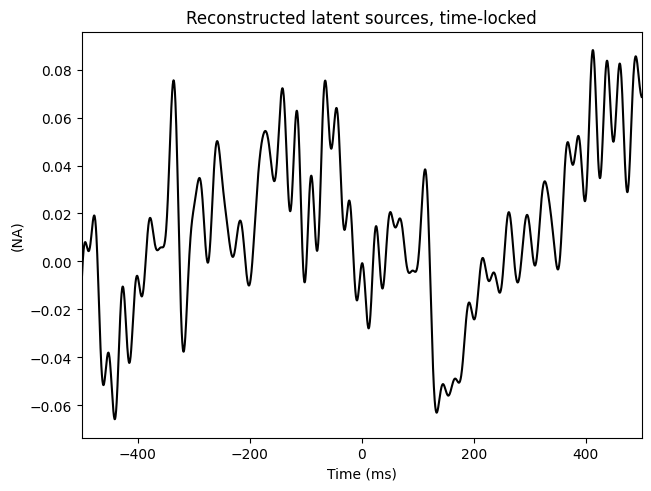

In [261]:
ica.plot_sources(eog_epochs_2.average(), picks=[48])

In [285]:
"""SPRAWDZENIE ZAKLASYFIKOWANIA KOMPONENTÓW JAKO MIĘŚNIOWE"""

for idx,label in enumerate(labels_1):
    if label == "other":
        print(f"{idx} : {label}")
    

9 : other
14 : other
44 : other
50 : other
52 : other
54 : other
55 : other


In [257]:
print(f"Znalezione artefakty mięśniowe - {emg_indices}")

Znalezione artefakty mięśniowe - [6, 8, 9, 12, 15, 16, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 29, 30, 31, 32, 33, 40, 45, 48]


In [299]:
ica.exclude = [0,1,4,5,6,8,9,12,14,15,16,18,19,20,21,23,24,25,26,27,29,30,31,32,33,36,37,40,42,44,45,46,48,49,50,52,53,54,55]


    Using multitaper spectrum estimation with 7 DPSS windows
Not setting metadata
256 matching events found
No baseline correction applied
0 projection items activated
Creating RawArray with float64 data, n_channels=3, n_times=2928640
    Range : 0 ... 2928639 =      0.000 ...  1430.000 secs
Ready.


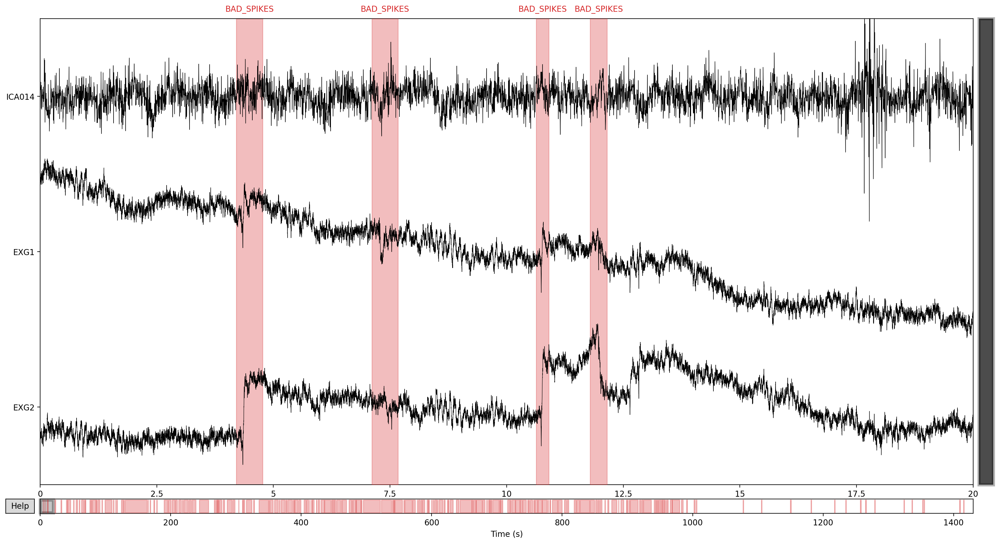

In [297]:
"""OCENA WYNIKÓW"""
ica.plot_properties(raw_for_ica_fitting,picks=[14])
ica.plot_sources(raw_for_ica_fitting,picks=[14])

In [298]:
if raw_for_annotation.annotations is not None:
    raw.set_annotations(raw_for_annotation.annotations)
    print(f"Adnotacje BAD skopiowane do 'raw': {raw.annotations}")

Adnotacje BAD skopiowane do 'raw': <Annotations | 193 segments: BAD_SPIKES (193)>


In [300]:
"""TWORZĘ KOPIĘ RAW"""
raw_cleaned_by_ica = raw.copy()


In [302]:
"""ZASTOSOWANIE ROZWIĄZANIA ICA"""
print(f"\nStosowanie ICA do sygnału 'raw_cleaned_by_ica' (kopii 'raw'). Wykluczane komponenty: {ica.exclude}")
ica.apply(raw_cleaned_by_ica, exclude=ica.exclude)
print("Zastosowano ICA.")


Stosowanie ICA do sygnału 'raw_cleaned_by_ica' (kopii 'raw'). Wykluczane komponenty: [0, 1, 4, 5, 6, 8, 9, 12, 14, 15, 16, 18, 19, 20, 21, 23, 24, 25, 26, 27, 29, 30, 31, 32, 33, 36, 37, 40, 42, 44, 45, 46, 48, 49, 50, 52, 53, 54, 55]
Applying ICA to Raw instance
    Transforming to ICA space (56 components)
    Zeroing out 39 ICA components
    Projecting back using 64 PCA components
Zastosowano ICA.


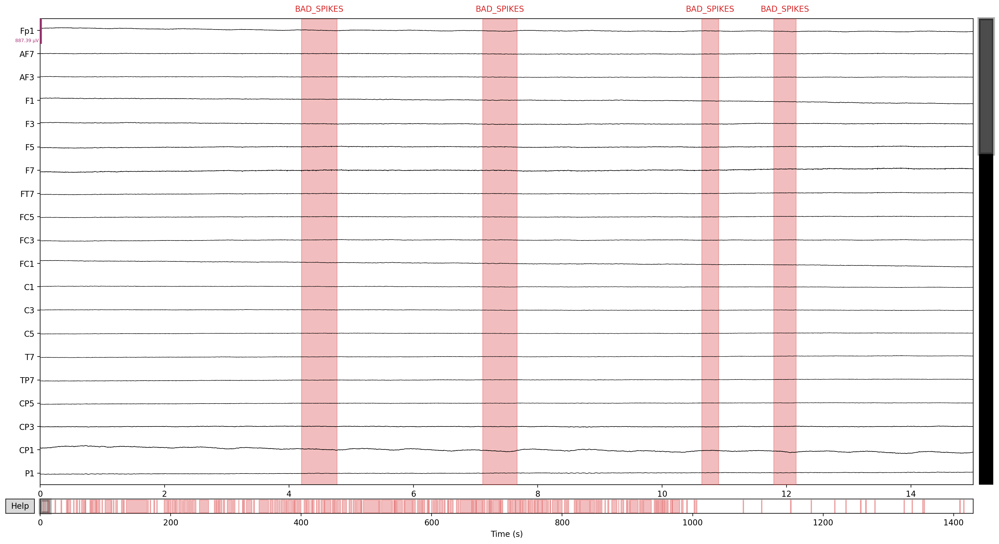

Channels marked as bad:
none


In [303]:
raw_cleaned_by_ica.plot(duration=15, scalings='auto')

In [306]:
raw_main_analysis = raw_cleaned_by_ica.copy()

In [310]:
l_freq_microstates = 0.1
h_freq_microstates = 40.0

In [311]:
raw_main_analysis.filter(l_freq=l_freq_microstates, h_freq=h_freq_microstates)

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 67585 samples (33.000 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    1.0s


<RawEDF | 20241017_kp.bdf, 69 x 2928640 (1430.0 s), ~1.51 GiB, data loaded>

In [2]:
raw_main_analysis.plot()

NameError: name 'raw_main_analysis' is not defined

In [314]:
pip install pyEDFlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 3.2 MB/s eta 0:00:00 MB/s eta 0:00:01:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for pyEDFlib: filename=pyedflib-0.1.40-cp313-cp313-macosx_15_0_arm64.whl size=2316475 sha256=e87a8773f4bc2e2e89b2e4880c8e4157dcabbc1a6f72e808b41907b4cdfde7a4
  Stored in directory: /Users/szymbierz/Library/Caches/pip/wheels/ef/88/49/e58dfe690999d44d611e76c9c5759132d1906c1272fbfe9fd3
Successfully built pyEDFlib

[notice] A new release of pip is available: 25.0 -> 25.1.1
[notice] To update, run: /opt/homebrew/Cellar/jupyterlab/4.4.1_1/libexec/bin/python -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [320]:
pip install edfio



[notice] A new release of pip is available: 25.0 -> 25.1.1
[notice] To update, run: /opt/homebrew/Cellar/jupyterlab/4.4.1_1/libexec/bin/python -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [321]:
mne.export.export_raw(
    fname="raw_main_analysis.edf",
    raw=raw,
    fmt="edf",
    overwrite=True
)

In [1]:
a

NameError: name 'a' is not defined

In [4]:
import mne 
import matplotlib.pyplot as plt
import numpy as np 
from mne.preprocessing import ICA, create_eog_epochs, create_ecg_epochs #funkcje ica
from mne_icalabel import label_components #ica-label algorytm
import onnxruntime #biblioteka do obsługi ica-label
#backend matplotliba 
%matplotlib qt 
d_path = "eeg_files/20241017_kp.bdf" #ścieżka do pliku
ch_eog = ["EXG1","EXG2"] #zdefiniowanie dedykowanych kanałów EOG
ch_ecg = ["EXG3","EXG4"] #zdefiniowanie dedykowanych kanałów ECG
ch_exclude = [f"EXG{i}" for i in range(5,9)] #wykluczenie kanałów niewykorzystanych w badaniu
d_path_2 = "/Users/szymbierz/Desktop/wszystko/notebooks/statystyka/inne/eeg/raw_main_analysis.edf"
raw_analysis = mne.io.read_raw_edf(
    d_path_2, preload = True, eog = ch_eog, misc = ch_ecg, exclude = ch_exclude 
)
raw_analysis.set_montage("biosemi64")


Extracting EDF parameters from /Users/szymbierz/Desktop/wszystko/notebooks/statystyka/inne/eeg/raw_main_analysis.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2928639  =      0.000 ...  1430.000 secs...


<RawEDF | raw_main_analysis.edf, 69 x 2928640 (1430.0 s), ~1.51 GiB, data loaded>

In [5]:
raw_for_filt = raw_analysis.copy()

In [6]:
raw_for_filt = raw_analysis.copy()
raw_for_filt.filter(l_freq = 1,h_freq=45)

raw_for_filt.notch_filter(50)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 67585 samples (33.000 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.9s


Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 13517 samples (6.600 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.6s


<RawEDF | raw_main_analysis.edf, 69 x 2928640 (1430.0 s), ~1.51 GiB, data loaded>

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.
Using matplotlib as 2D backend.


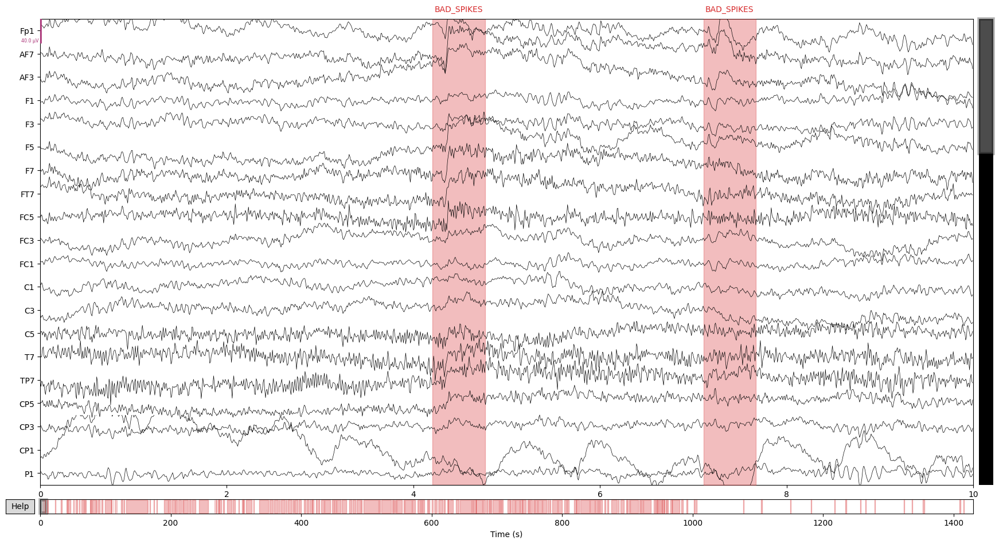

2025-05-15 17:42:14.177 Python[27914:13769286] +[IMKClient subclass]: chose IMKClient_Modern
2025-05-15 17:42:14.177 Python[27914:13769286] +[IMKInputSession subclass]: chose IMKInputSession_Modern


Channels marked as bad:
none


2025-05-15 17:43:33.917 Python[27914:13769286] _TIPropertyValueIsValid called with 16 on nil context!
2025-05-15 17:43:33.917 Python[27914:13769286] imkxpc_getApplicationProperty:reply: called with incorrect property value 16, bailing.
2025-05-15 17:43:33.917 Python[27914:13769286] Text input context does not respond to _valueForTIProperty:


In [7]:
raw_for_filt.set_eeg_reference('average')
raw_for_filt.plot()

Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 0.1 - 20 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 0.10
- Lower transition bandwidth: 0.10 Hz (-6 dB cutoff frequency: 0.05 Hz)
- Upper passband edge: 20.00 Hz
- Upper transition bandwidth: 5.00 Hz (-6 dB cutoff frequency: 22.50 Hz)
- Filter length: 8251 samples (33.004 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


Filtering raw data in 1 contiguous segment
Setting up band-stop filter from 49 - 51 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 49.38
- Lower transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 49.12 Hz)
- Upper passband edge: 50.62 Hz
- Upper transition bandwidth: 0.50 Hz (-6 dB cutoff frequency: 50.88 Hz)
- Filter length: 1651 samples (6.604 s)

EEG channel type selected for re-referencing
Applying average reference.
Applying a custom ('EEG',) reference.


[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s


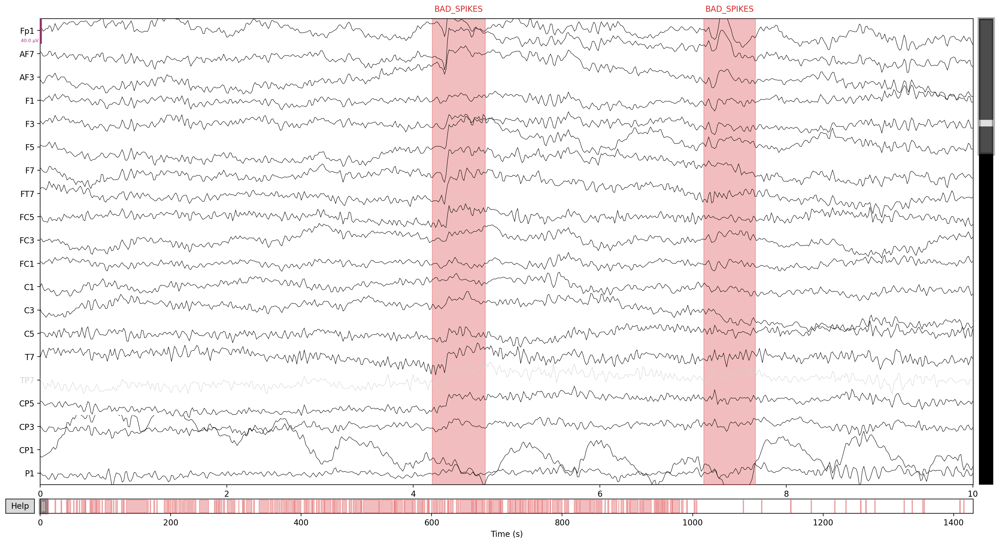

Channels marked as bad:
[np.str_('TP7')]


In [17]:
raw_for_filt.filter(l_freq = 0.1,h_freq=20)
raw_for_filt.notch_filter(50)
raw_for_filt.set_eeg_reference('average')
raw_for_filt.plot()


In [8]:
pip install pycrostates


[notice] A new release of pip is available: 25.0 -> 25.1.1
[notice] To update, run: /opt/homebrew/Cellar/jupyterlab/4.4.1_1/libexec/bin/python -m pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [8]:
from pycrostates.preprocessing import extract_gfp_peaks
epochs = mne.make_fixed_length_epochs(raw_for_filt, duration=2, preload=True)
gfp_data = extract_gfp_peaks(epochs, min_peak_distance=3)
gfp_data

Not setting metadata
715 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 715 events and 4096 original time points ...
0 bad epochs dropped


< ChData | 60328 samples >

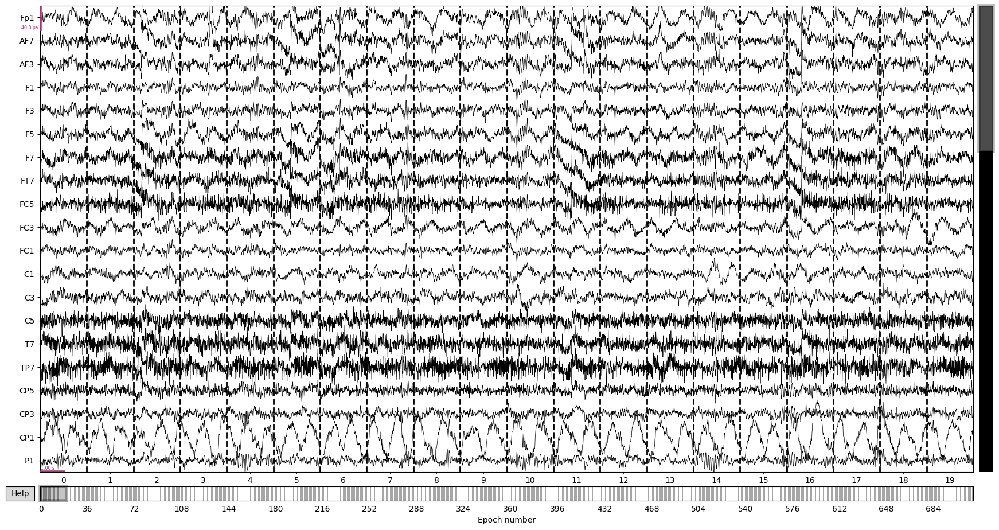

Dropped 0 epochs: 
The following epochs were marked as bad and are dropped:
[]
Channels marked as bad:
none


In [10]:
epochs.plot()

/opt/homebrew/Cellar/jupyterlab/4.4.1_1/libexec/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


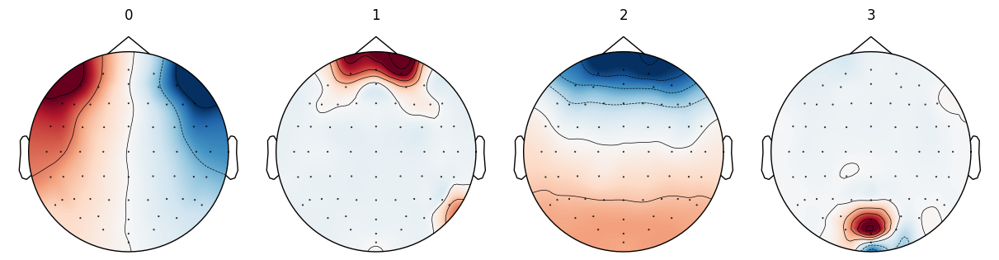

In [11]:
from pycrostates.cluster import ModKMeans
ModK = ModKMeans(n_clusters=4, random_state=42)
ModK.fit(gfp_data, n_jobs=5, verbose="WARNING")
ModK.plot()

In [15]:
gfp_data = extract_gfp_peaks(raw_for_filt, min_peak_distance=3)
gfp_data

< ChData | 25669 samples >

Exception ignored in: <function ResourceTracker.__del__ at 0x1027674c0>
Traceback (most recent call last):
  File "/opt/homebrew/Cellar/python@3.13/3.13.3/Frameworks/Python.framework/Versions/3.13/lib/python3.13/multiprocessing/resource_tracker.py", line 82, in __del__
  File "/opt/homebrew/Cellar/python@3.13/3.13.3/Frameworks/Python.framework/Versions/3.13/lib/python3.13/multiprocessing/resource_tracker.py", line 91, in _stop
  File "/opt/homebrew/Cellar/python@3.13/3.13.3/Frameworks/Python.framework/Versions/3.13/lib/python3.13/multiprocessing/resource_tracker.py", line 116, in _stop_locked
ChildProcessError: [Errno 10] No child processes
Exception ignored in: <function ResourceTracker.__del__ at 0x1065eb4c0>
Traceback (most recent call last):
  File "/opt/homebrew/Cellar/python@3.13/3.13.3/Frameworks/Python.framework/Versions/3.13/lib/python3.13/multiprocessing/resource_tracker.py", line 82, in __del__
  File "/opt/homebrew/Cellar/python@3.13/3.13.3/Frameworks/Python.framework/Versi

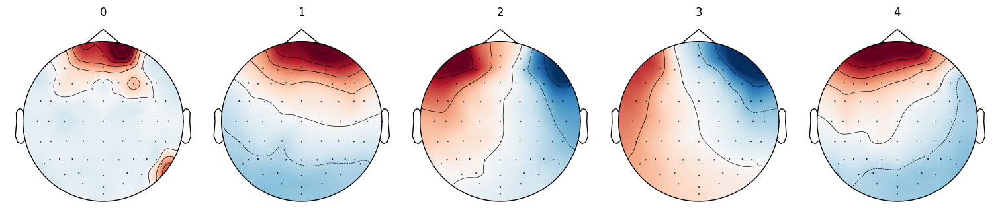

In [18]:
ModK = ModKMeans(n_clusters=5, random_state=42)
ModK.fit(gfp_data, n_jobs=30, verbose="WARNING")
ModK.plot()

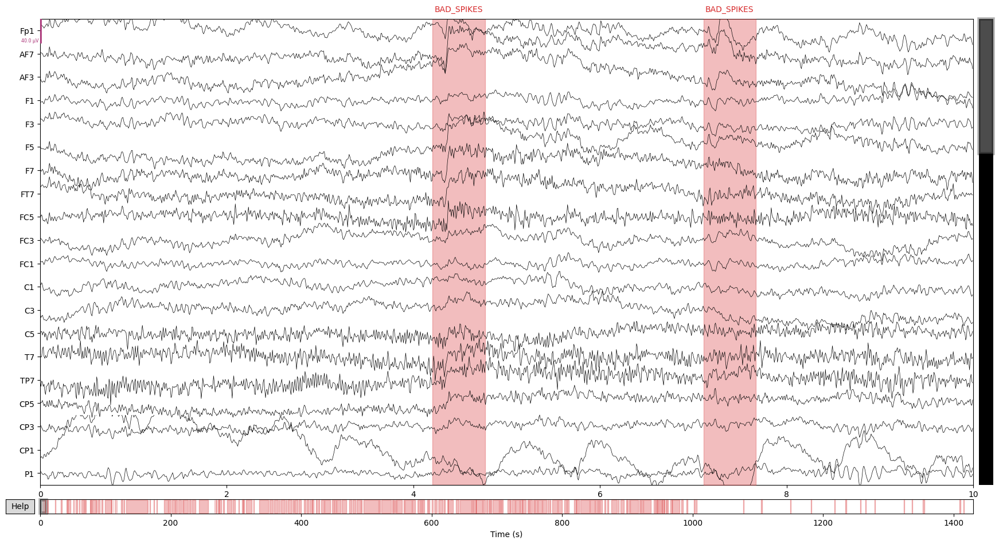

In [19]:
raw_for_filt.plot()

In [28]:
gfp_data = extract_gfp_peaks(raw_for_filt, min_peak_distance=3)

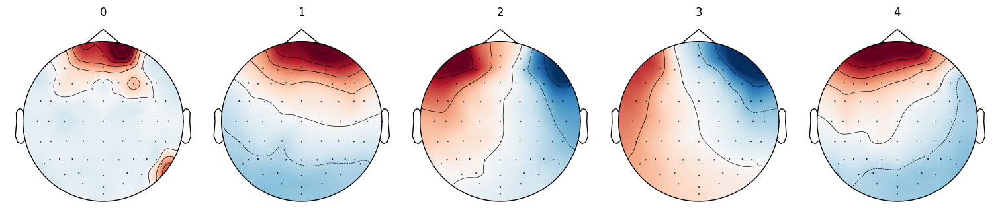

In [29]:
ModK = ModKMeans(n_clusters=5, random_state=42)
ModK.fit(gfp_data, n_jobs=5, verbose="WARNING")
ModK.plot()

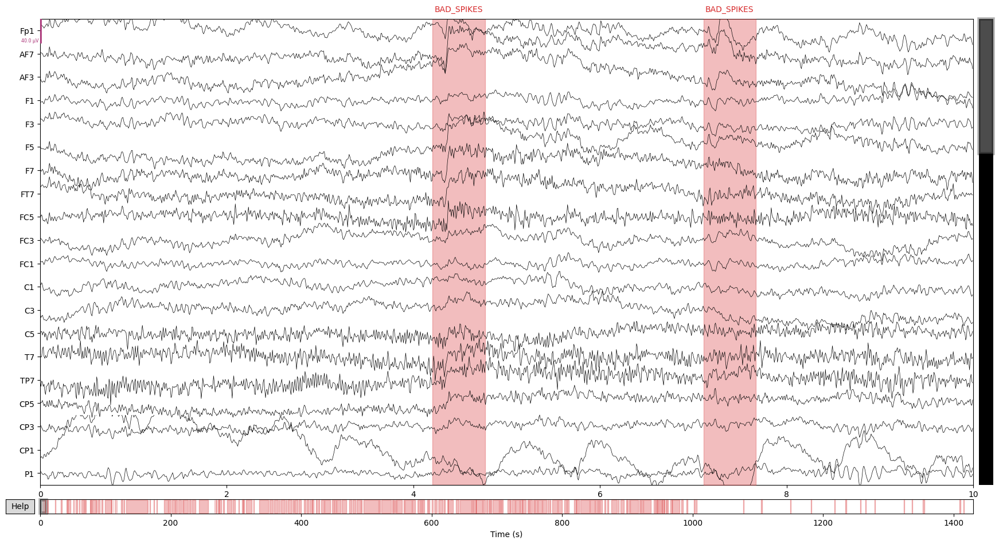

In [25]:
raw_for_filt.plot()

In [34]:
all_channels = raw_for_filt.ch_names
data_3 = raw_for_filt.copy().pick(all_channels).get_data()
corr_3 = np.corrcoef(data_3)
plt.figure(figsize=(10, 10))
plt.imshow(corr_3, cmap='RdBu_r', interpolation='nearest')
plt.colorbar(label='Pearson r')
plt.xticks(np.arange(len(all_channels)), all_channels, rotation=90)
plt.yticks(np.arange(len(all_channels)), all_channels)
plt.tight_layout()


Exception ignored in: <function ResourceTracker.__del__ at 0x107e674c0>
Traceback (most recent call last):
  File "/opt/homebrew/Cellar/python@3.13/3.13.3/Frameworks/Python.framework/Versions/3.13/lib/python3.13/multiprocessing/resource_tracker.py", line 82, in __del__
  File "/opt/homebrew/Cellar/python@3.13/3.13.3/Frameworks/Python.framework/Versions/3.13/lib/python3.13/multiprocessing/resource_tracker.py", line 91, in _stop
  File "/opt/homebrew/Cellar/python@3.13/3.13.3/Frameworks/Python.framework/Versions/3.13/lib/python3.13/multiprocessing/resource_tracker.py", line 116, in _stop_locked
ChildProcessError: [Errno 10] No child processes
Exception ignored in: <function ResourceTracker.__del__ at 0x1079db4c0>
Traceback (most recent call last):
  File "/opt/homebrew/Cellar/python@3.13/3.13.3/Frameworks/Python.framework/Versions/3.13/lib/python3.13/multiprocessing/resource_tracker.py", line 82, in __del__
  File "/opt/homebrew/Cellar/python@3.13/3.13.3/Frameworks/Python.framework/Versi

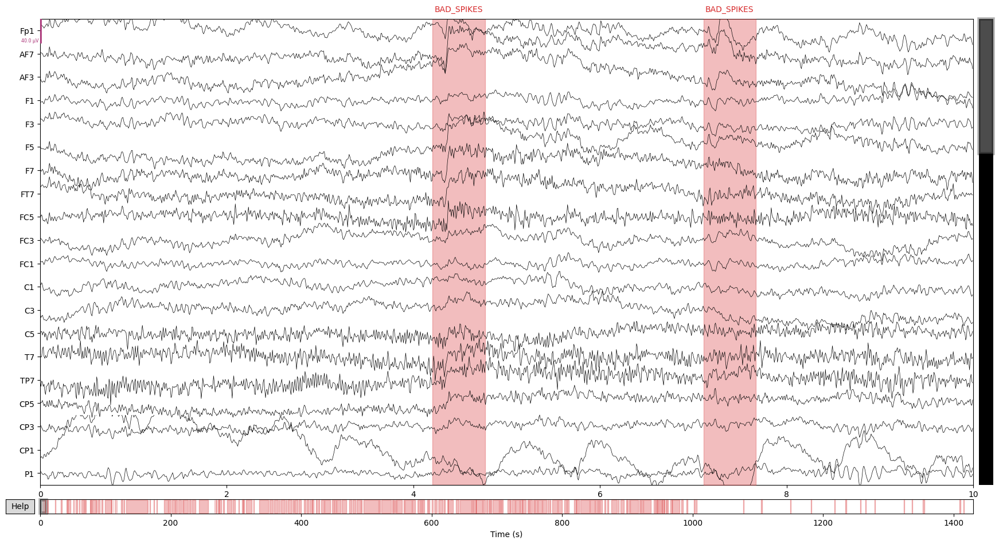

In [32]:
raw_for_filt.plot()

In [33]:
raw_for_filt.interpolate_bads()

<RawEDF | raw_main_analysis.edf, 69 x 2928640 (1430.0 s), ~1.51 GiB, data loaded>

In [12]:
gfp_data = extract_gfp_peaks(raw_for_filt, min_peak_distance=3)

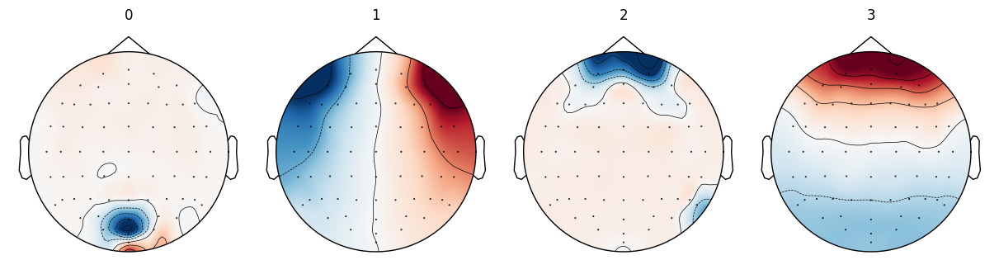

In [13]:
ModK = ModKMeans(n_clusters=4, random_state=42)
ModK.fit(gfp_data, n_jobs=5, verbose="WARNING")
ModK.plot()

In [39]:
import os
import pathlib
import scipy.io as sio
from pyprep.prep_pipeline import PrepPipeline

In [46]:
sample_rate = raw_original.info["sfreq"]
montage = mne.channels.make_standard_montage("biosemi64")
raw_copy = raw_original.copy()

In [ ]:
prep_params = {
    "ref_chs": "eeg",
    "reref_chs": "eeg",
    "line_freqs": np.arange(60, sample_rate / 2, 60),
}

prep = PrepPipeline(raw_copy, prep_params, montage)
prep.fit()

In [1]:
prep_params

NameError: name 'prep_params' is not defined

In [7]:
raw_for_filt = raw.copy()
raw_for_filt.filter(l_freq = 1,h_freq=45)


Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 45 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 45.00 Hz
- Upper transition bandwidth: 11.25 Hz (-6 dB cutoff frequency: 50.62 Hz)
- Filter length: 6759 samples (3.300 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.8s


<RawEDF | 20241017_kp.bdf, 69 x 2928640 (1430.0 s), ~1.51 GiB, data loaded>

In [14]:
raw_cropped=raw_for_filt.crop(0,960)

In [16]:
raw_cropped.set_eeg_reference("average")

<RawEDF | 20241017_kp.bdf, 69 x 1966081 (960.0 s), ~1.01 GiB, data loaded>

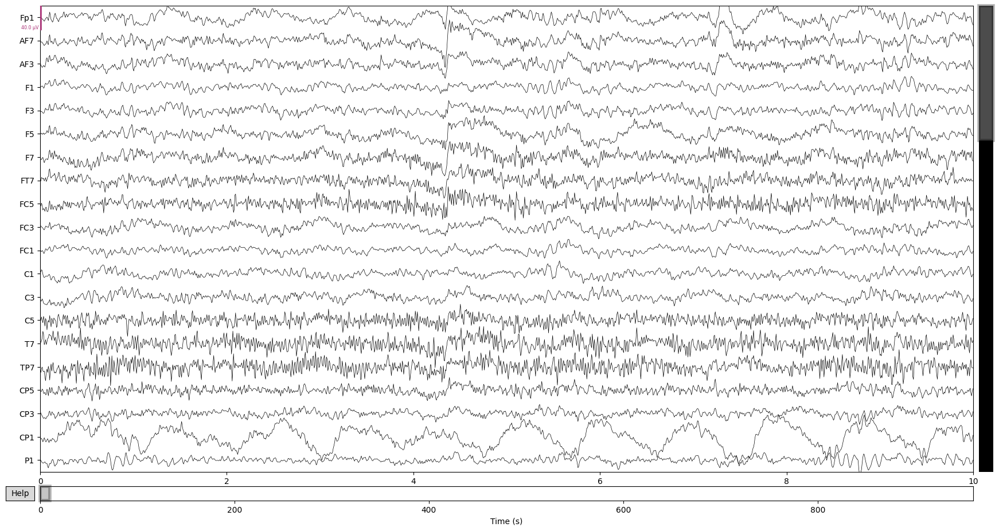

In [17]:
raw_cropped.plot()

In [20]:
ica = ICA(
    max_iter="auto",  #automatyczna liczba iteracji
    method="fastica",  #wymog ica-label
    random_state=97, #ziarno
) #wymog ica-label

ica.fit(raw_cropped)  

Method,fastica
Fit parameters,algorithm=parallelfun=logcoshfun_args=Nonemax_iter=1000
Fit,41 iterations on raw data (1966081 samples)
ICA components,63
Available PCA components,64
Channel types,eeg
ICA components marked for exclusion,—


In [21]:
ica.plot_components()

[<MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 975x967 with 20 Axes>,
 <MNEFigure size 585x260 with 3 Axes>]

In [22]:
eog_indices,eog_scores = ica.find_bads_eog(raw_cropped,ch_name=ch_eog)

In [23]:
print(eog_indices)

[np.int64(1), np.int64(0), np.int64(6), np.int64(13)]


In [24]:
ica.exclude = [1,0,6,13]

In [25]:
raw_filtered = ica.apply(raw_cropped,exclude=ica.exclude)

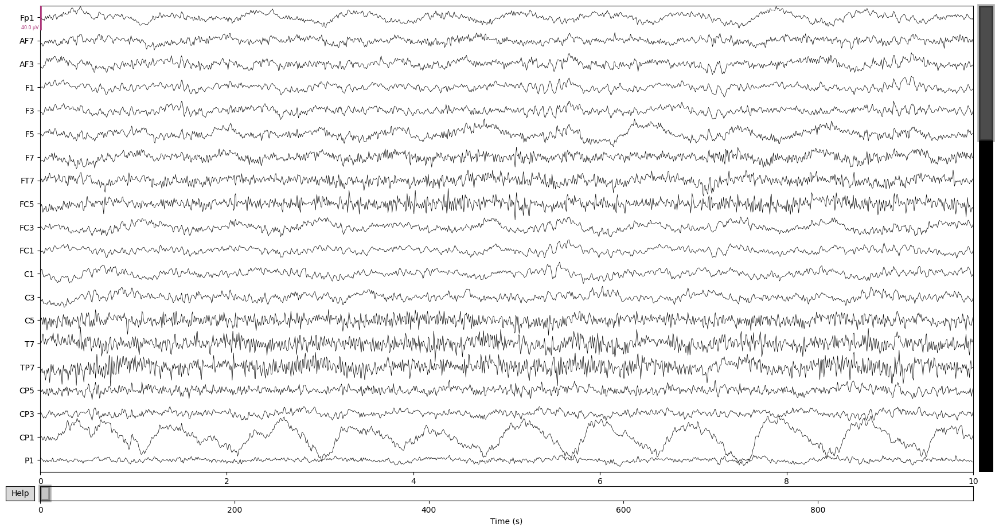

In [26]:
raw_filtered.plot()

In [27]:
raw_filtered_cropped = raw_filtered.crop(0,880)

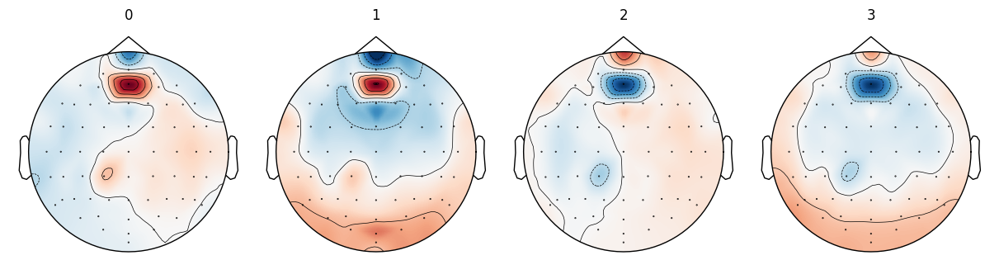

In [28]:
gfp_data = extract_gfp_peaks(raw_filtered_cropped, min_peak_distance=3)
ModK = ModKMeans(n_clusters=4, random_state=42)
ModK.fit(gfp_data, n_jobs=5, verbose="WARNING")
ModK.plot()

ValueError: setting an array element with a sequence. The requested array has an inhomogeneous shape after 1 dimensions. The detected shape was (3,) + inhomogeneous part.

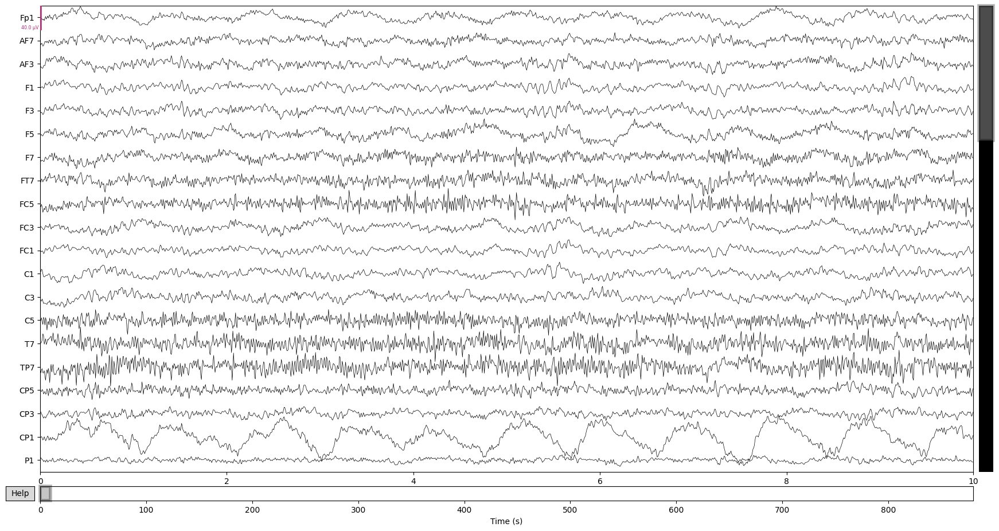

In [32]:
raw_filtered_cropped.plot()


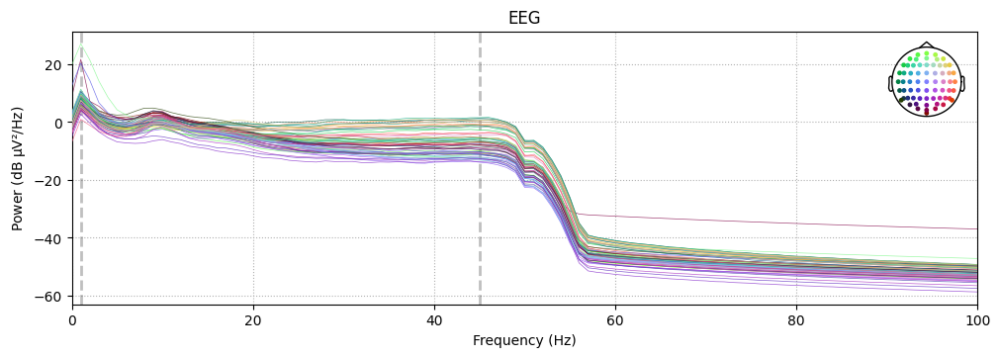

In [40]:
raw_filtered_cropped.compute_psd(fmax=100).plot()

In [41]:
raw_filtered_cropped.info["bads"]= ["AFz","Oz","CP1"]

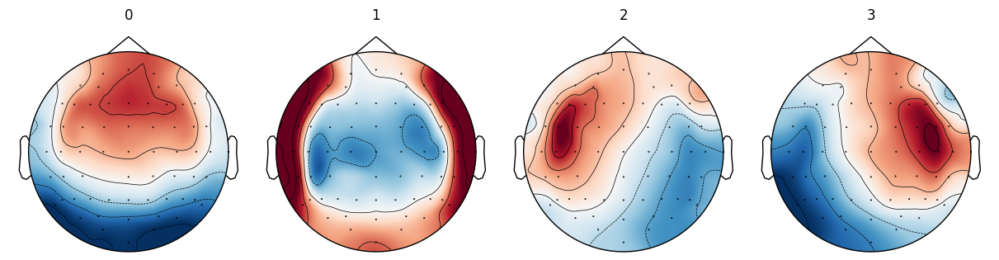

In [42]:
gfp_data = extract_gfp_peaks(raw_filtered_cropped, min_peak_distance=3)
ModK = ModKMeans(n_clusters=4, random_state=42)
ModK.fit(gfp_data, n_jobs=5, verbose="WARNING")
ModK.plot()

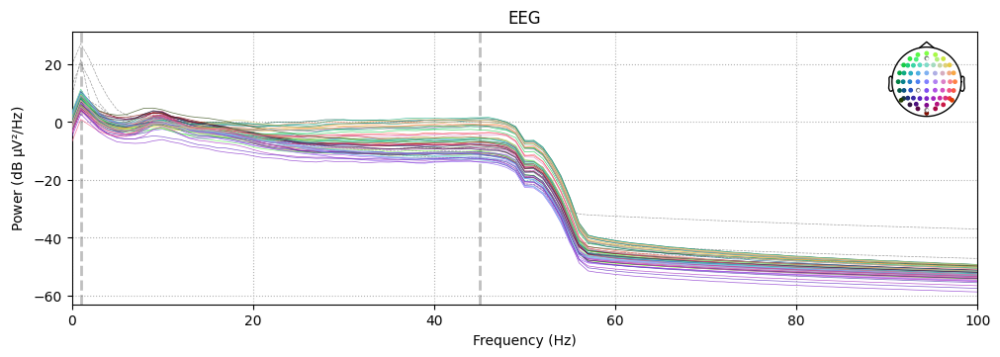

In [43]:
raw_filtered_cropped.compute_psd(fmax=100).plot()

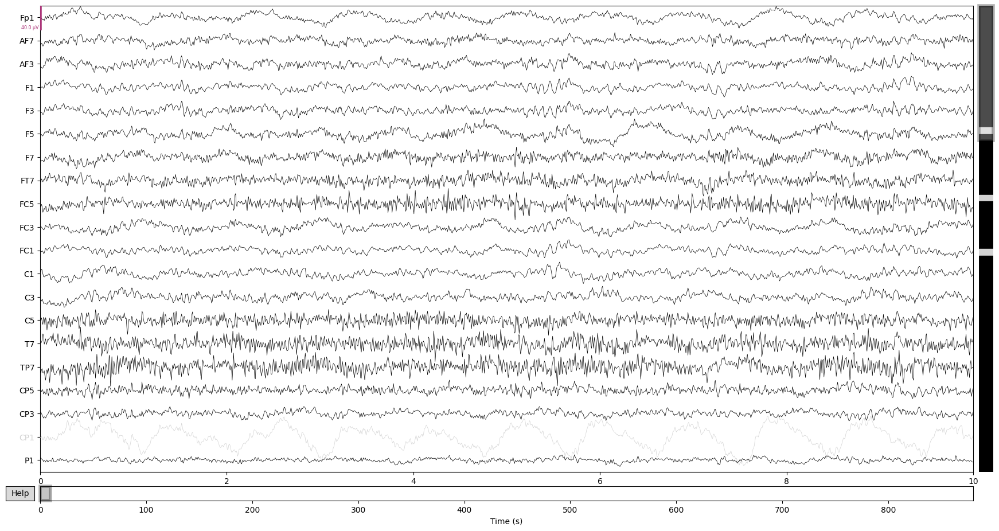

Exception ignored in: <function ResourceTracker.__del__ at 0x103adb4c0>
Traceback (most recent call last):
  File "/opt/homebrew/Cellar/python@3.13/3.13.3/Frameworks/Python.framework/Versions/3.13/lib/python3.13/multiprocessing/resource_tracker.py", line 82, in __del__
  File "/opt/homebrew/Cellar/python@3.13/3.13.3/Frameworks/Python.framework/Versions/3.13/lib/python3.13/multiprocessing/resource_tracker.py", line 91, in _stop
  File "/opt/homebrew/Cellar/python@3.13/3.13.3/Frameworks/Python.framework/Versions/3.13/lib/python3.13/multiprocessing/resource_tracker.py", line 116, in _stop_locked
ChildProcessError: [Errno 10] No child processes
Exception ignored in: <function ResourceTracker.__del__ at 0x102fc74c0>
Traceback (most recent call last):
  File "/opt/homebrew/Cellar/python@3.13/3.13.3/Frameworks/Python.framework/Versions/3.13/lib/python3.13/multiprocessing/resource_tracker.py", line 82, in __del__
  File "/opt/homebrew/Cellar/python@3.13/3.13.3/Frameworks/Python.framework/Versi

In [44]:
raw_filtered_cropped.plot()

In [46]:
epochs = mne.make_fixed_length_epochs(raw_filtered_cropped, duration=2, preload=True)
gfp_data = extract_gfp_peaks(epochs, min_peak_distance=3,reject_by_annotation=True)

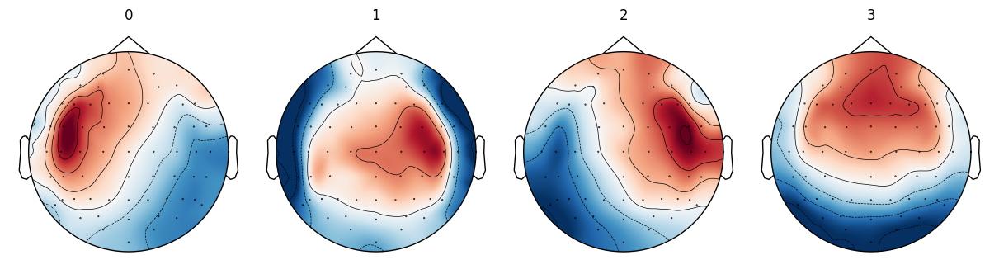

In [47]:
gfp_data = extract_gfp_peaks(raw_filtered_cropped, min_peak_distance=3)
ModK = ModKMeans(n_clusters=4, random_state=42)
ModK.fit(gfp_data, n_jobs=5, verbose="WARNING")
ModK.plot()